In [ ]:
# !pip install pyarrow
# !pip install mpld3
# !pip install -U scikit-learn

In [2]:
# created with love in cooperation with ASPIS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
import matplotlib.mlab as mlab
import datetime as dt
from sklearn.feature_selection import SelectKBest, f_classif, f_regression
import mpld3

pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
df2 = pd.read_parquet('data/13839.parquet.gzip')
df2=df2.drop(['SVID', 'Station', 'Latitude_IPP', 'Longitude_IPP', 'Latitude_bin', 'Longitude_bin', 'Bin_index'], axis=1)

In [4]:
df2=df2.sort_index()
df2['dt']=df2.index
df2=df2.groupby('dt').mean()

In [5]:
idx2=pd.date_range(start=(pd.to_datetime(df2.index)).min(), end=(pd.to_datetime(df2.index)).max(), freq="1min")
df2.index = pd.DatetimeIndex(df2.index)
df2=df2.reindex(idx2, fill_value=np.nan)

In [6]:
df2['Phi60_Sig1_1min'] = df2['Phi60_Sig1'].shift(-1)
df2['Phi60_Sig1_5min'] = df2['Phi60_Sig1'].shift(-5)
df2['dt']=df2.index
df2=df2.resample('60T', on='dt').mean()

all_indexes=pd.read_csv('data/all_ids_final_final.csv', index_col=0)
all_indexes.index = pd.DatetimeIndex(all_indexes.index)
df2=pd.merge(df2, all_indexes, how='left', left_index=True, right_index=True)

In [7]:
df2_copy = df2.copy()
df2.drop(columns='Phi60_Sig1', inplace=True)
df2.dropna(inplace=True)

In [12]:
def anova_analysis(df, predicted_label_no_time, numFeatures, minutes, dfName):
    predicted_label=predicted_label_no_time+"_%smin"%minutes
    ######### prediction
    predicted_column = df.columns.get_loc(predicted_label)
    X = df.loc[:, df.columns != predicted_label].values
    feature_labels = df.loc[:, df.columns != predicted_label].columns.values
    y = df[predicted_label].values

    ######### anova
    # specify the number of features to keep based on univariate analysis of variance F-score
    fSelect_model = SelectKBest(score_func=f_regression, k=numFeatures)
    X_fSelect = fSelect_model.fit_transform(X,y) 
        # FIT: Run score function on (X, y) and get the appropriate features
        # TRANSFORM: Reduce X to the selected features
    # print( 'number of selected features = {0}'.format(np.shape(X_fSelect)[1]) )

    scores = fSelect_model.scores_
    # print(scores)

    selected_feature_labels = feature_labels[np.argwhere(fSelect_model.get_support() == True)]
    # print(selected_feature_labels)

    # print('f_classif is an ANOVA F-test to determine \n  the probability that the means of the \n  input variables are the same as the mean \n  of the target variable')
    # print('The higher the value, the greater \n  the probability that the two means are different')
    # print('.....And, therefore, the more information \n    that variable provides on the target variable\n\n')

    # print('the F-test ignores correlations between the variables and is, therefore, \n    a univariate feature selection algorithm')

    # Examine the selected features more intuitively 
    #     It's not easy to interpret the scores in this fashion, so let's plot the results
    scores[np.isnan(scores)] = 0.
    mpld3.disable_notebook()
    plt.clf()
    order = np.argsort(scores)
    orderedfeaturelabels = [feature_labels[i] for i in order]
    y_pos2 = np.arange(len(feature_labels))
    plt.barh(y_pos2, sorted(scores/np.max(scores)), align='center')
    plt.barh(y_pos2, sorted(scores), align='center')

    plt.ylim((-1, numFeatures))
    plt.yticks(y_pos2, orderedfeaturelabels, fontsize=12)
    plt.xlabel('Fisher Score', fontsize=15)
    plt.title('bin nr. %s Ranking of features - %s min ahead'%(dfName, minutes), fontsize=15)
    fig = plt.gcf()
    fig.set_size_inches(8,30)
    #fig.savefig('features_FisherScores.png',bbox_inches='tight')

    # plt.show()
    # fig.savefig('anova/%s_anova_%smin_1.png'%(dfName, minutes),bbox_inches='tight')
    return scores, y_pos2

(array([1.06320124e+02, 9.93754339e+02, 7.00437578e+02, 1.91717778e+03,
        6.99962904e+02, 6.39538028e+02, 1.12597430e+02, 3.91020257e+02,
        4.04792389e+02, 4.84684535e+02, 1.92734633e+03, 2.19484856e+04,
        2.17041861e+03, 2.72405812e+00, 1.27513061e+01, 1.50824905e+03,
        1.03835966e+03, 1.33048147e+02, 6.20215335e+02, 3.33181950e+01,
        8.00779000e-02, 5.78019879e+02, 1.30132125e+03, 2.29083716e+03,
        2.62777193e+02, 5.87618057e+02, 3.96073470e+02, 2.74875427e+02,
        5.27746833e+03, 6.66309771e+02, 3.11896308e+03, 4.80876159e+03,
        8.63201462e+02, 8.29053201e+03, 6.51391913e+03, 8.44209887e+03,
        7.19111152e+03, 1.39326024e+01, 6.08608587e+02, 1.65138285e+01,
        1.12039505e+01, 8.64254990e+02, 8.30011989e+01, 2.31361448e-01,
        5.17407349e-03, 2.96953484e+03, 3.88140459e+03, 5.43255232e+03]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29

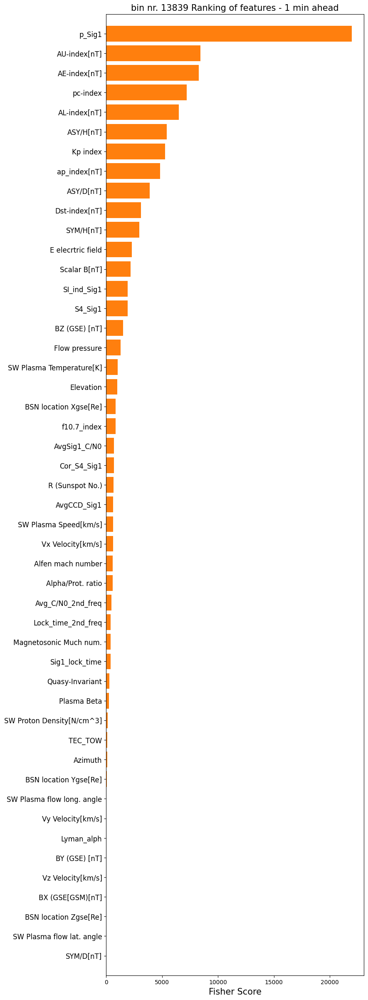

In [13]:
anova_analysis(df2.drop(['Phi60_Sig1_5min'], axis=1), "Phi60_Sig1", 48, 1, "13839")

In [14]:
colnames=['Phi60_Sig1','Phi60_Sig1_1min','Phi60_Sig1_5min']
not_ordered_colnames=df2_copy.columns.tolist()
for i in colnames:
    not_ordered_colnames.remove(i)
colnames+=not_ordered_colnames
df2_copy=df2_copy[[*colnames]]


In [15]:
def correl(dataFrame, name):
    corr_matrix = dataFrame.corr(method='spearman')
    # print(corr_matrix.to_string())

    # prints list of columns, that can be droped because they correlate more than the set threshold
    length = len(corr_matrix.columns)
    columns_to_drop = set()
    for i in range(length):
        for j in range(length):
            if (i != j) and (not np.isnan(corr_matrix.iloc[i, j])):
                if abs(corr_matrix.iloc[i, j]) >= 0.5:    # the treshold from which the columns are considered to be correlated
                    # print("column i =", end=" ")
                    print(corr_matrix.columns[i], end="-----")
                    # print("sum:", end=" ")
                    # print(sum(abs(corr_matrix.iloc[:, i])), end="  ")
                    # print(", column j =", end=" ")
                    print(corr_matrix.columns[j], end="-----")
                    # print("sum:", end=" ")
                    # print(sum(abs(corr_matrix.iloc[:, j])), end=".......")
                    print(abs(corr_matrix.iloc[i, j]))
                    if sum(abs(corr_matrix.iloc[:, i])) > sum(abs(corr_matrix.iloc[:, j])):
                        columns_to_drop.add(corr_matrix.columns[i])
                    else:
                        columns_to_drop.add(corr_matrix.columns[j])

    print()
    print(columns_to_drop)
    print("Number of correlated columns: ", str(len(columns_to_drop)))

    mask = np.zeros_like(corr_matrix, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    f, ax = plt.subplots(figsize=(400, 400))

    heatmap = sns.heatmap(corr_matrix,
                        # mask=mask,
                        square=True,
                        linewidths=.1,
                        cmap='coolwarm',
                        cbar_kws={'shrink': 0.5,
                                    'ticks': [-1, -.5, 0, 0.5, 1]},
                        vmin=-1,
                        vmax=1,
                        annot=True,
                        fmt='.2f',
                        annot_kws={"size": 52})  # was 10 for big graph

    # add the column names as labels
    ax.set_yticklabels(corr_matrix.columns, rotation=0, fontdict={'fontsize': 52})  # was 22 for big graph
    ax.set_xticklabels(corr_matrix.columns, fontdict={'fontsize': 52})  # was 22 for big graph

    sns.set_style({'xtick.bottom': True}, {'ytick.left': True})
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=8)

    #########################
    heatmap.get_figure().savefig('cor_matrix_%s.png'%name, bbox_inches='tight')


In [16]:
correl(df2_copy, "13839")

Phi60_Sig1-----Phi60_Sig1_1min-----0.9987758332821712
Phi60_Sig1-----Phi60_Sig1_5min-----0.9854720664211453
Phi60_Sig1_1min-----Phi60_Sig1-----0.9987758332821712
Phi60_Sig1_1min-----Phi60_Sig1_5min-----0.9895632387087451
Phi60_Sig1_5min-----Phi60_Sig1-----0.9854720664211453
Phi60_Sig1_5min-----Phi60_Sig1_1min-----0.9895632387087451
Elevation-----AvgSig1_C/N0-----0.7007262208600897
Elevation-----S4_Sig1-----0.6559357503092035
Elevation-----Cor_S4_Sig1-----0.7081166526589827
Elevation-----Avg_C/N0_2nd_freq-----0.6317836089735079
Elevation-----SI_ind_Sig1-----0.6730531816643799
AvgSig1_C/N0-----Elevation-----0.7007262208600897
AvgSig1_C/N0-----S4_Sig1-----0.7503093410977346
AvgSig1_C/N0-----Cor_S4_Sig1-----0.993280637925939
AvgSig1_C/N0-----Avg_C/N0_2nd_freq-----0.6189599072874836
AvgSig1_C/N0-----SI_ind_Sig1-----0.7891457734852104
S4_Sig1-----Elevation-----0.6559357503092035
S4_Sig1-----AvgSig1_C/N0-----0.7503093410977346
S4_Sig1-----Cor_S4_Sig1-----0.777066476101768
S4_Sig1-----Avg_C/N0

/var/folders/5r/qdwbmr3x5r3d52wp_vbljtqr0000gn/T/ipykernel_37581/2120620210.py:30: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr_matrix, dtype=np.bool)
